In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

#### load dataset

In [3]:
data = pd.read_csv('../../data/processed/school_data.csv')

### numerical table

In [4]:
features = ['Agua', 'QualidadeAgua', 'Energia', 'CasaBanhoFuncional', 'TotalCasaBanho']

for i in features:
     # Print the feature name and unique values in the feature column, removing duplicates
    print(f'{i}: {list(dict.fromkeys(data[i].values))} \n')

data['QualidadeAgua'] = data['QualidadeAgua'].str.strip()
data['TotalCasaBanho'] = data['TotalCasaBanho'].replace(' ', 0)

# Create a new DataFrame 'numeric_data' by dropping columns that are not needed for numeric analysis
numeric_data = data.drop(['Provincia', 'Distrito', 'NomeEscola', 'TipoFonte', 'TipoEnergia', 'CasaBanho'], axis=1)

# Define dictionaries to map categorical values to numeric values for specific columns
agua = {'Não': 0, 'Sim': 1}
energia = {'Não': 0, 'Sim': 1}
casaBanhoFuncional = {'Não': 0, 'Sim': 1}
qualidadeAgua = {'Nenhuma': 0, 'Não Potável': 1, 'Potável': 2}

# Map the values in selected columns to their corresponding numeric values
numeric_data['Agua'] = numeric_data['Agua'].map(agua)
numeric_data['Energia'] = numeric_data['Energia'].map(energia)
numeric_data['CasaBanhoFuncional'] = numeric_data['CasaBanhoFuncional'].map(casaBanhoFuncional)
numeric_data['QualidadeAgua'] = numeric_data['QualidadeAgua'].map(qualidadeAgua)

numeric_data.head()

Agua: ['Não', 'Sim'] 

QualidadeAgua: ['Nenhuma', 'Não Potável', 'Potável', ' Potável'] 

Energia: ['Não', 'Sim'] 

CasaBanhoFuncional: ['Não', 'Sim'] 

TotalCasaBanho: ['0', '3', '6', '2', '4', '1', '5', '31', '7', '8', '9', '11', '16', '15', '10', '12', '22', '17', '14', '18', '24', '13', '20', '27', '30', '21', ' '] 



,Agua,QualidadeAgua,Energia,TotalCasaBanho,CasaBanhoFuncional,Longitude,Latitude
0,0,0,0,0,0,33.238361,-19.212528
1,0,0,0,0,0,35.200139,-13.476167
2,0,0,0,0,0,35.540361,-13.435000
3,0,0,0,0,0,35.792472,-13.337917
4,0,0,0,0,0,35.690269,-13.315156


In [259]:
data.head()

,Provincia,Distrito,NomeEscola,Agua,TipoFonte,QualidadeAgua,Energia,TipoEnergia,CasaBanho,TotalCasaBanho,CasaBanhoFuncional,Longitude,Latitude
0,Manica,Vanduzi,Escola Primário do 1º Grau 4 de Outubro,Não,Nenhuma Fonte,Nenhuma,Não,Nenhum,Não,0,Não,33.238361,-19.212528
1,Niassa,Chimbunila,Escola Primária de Naicuainha,Não,Nenhuma Fonte,Nenhuma,Não,Nenhum,Não,0,Não,35.200139,-13.476167
2,Niassa,Chimbunila,Escola Primária de Lipapa,Não,Nenhuma Fonte,Nenhuma,Não,Nenhum,Não,0,Não,35.540361,-13.435000
3,Niassa,Chimbunila,Escola Primária de Icuvi,Não,Nenhuma Fonte,Nenhuma,Não,Nenhum,Não,0,Não,35.792472,-13.337917
4,Niassa,Chimbunila,Escola Primária de Mbbau,Não,Nenhuma Fonte,Nenhuma,Não,Nenhum,Não,0,Não,35.690269,-13.315156


#### minimum_conditions function

Calculate the “minimum conditions” attribute for each school.
A school with minimum conditions will be considered one that has at least one of the basic resources (water, energy or functioal wc.

In [5]:
def minimum_conditions(row):
    if (row['Agua'] + row['Energia'] + row['CasaBanhoFuncional']) > 0:
        return 1
    else:
        return 0

In [6]:
numeric_data['CondicoesMinimas'] = numeric_data.astype(int).apply(minimum_conditions, axis=1)

In [7]:
numeric_data.head()

,Agua,QualidadeAgua,Energia,TotalCasaBanho,CasaBanhoFuncional,Longitude,Latitude,CondicoesMinimas
0,0,0,0,0,0,33.238361,-19.212528,0
1,0,0,0,0,0,35.200139,-13.476167,0
2,0,0,0,0,0,35.540361,-13.435000,0
3,0,0,0,0,0,35.792472,-13.337917,0
4,0,0,0,0,0,35.690269,-13.315156,0


##### save dataset

In [8]:
numeric_data.to_csv('../../data/processed/school_data(numeric).csv', index=False)

### geographic distributions

#### schools distribution

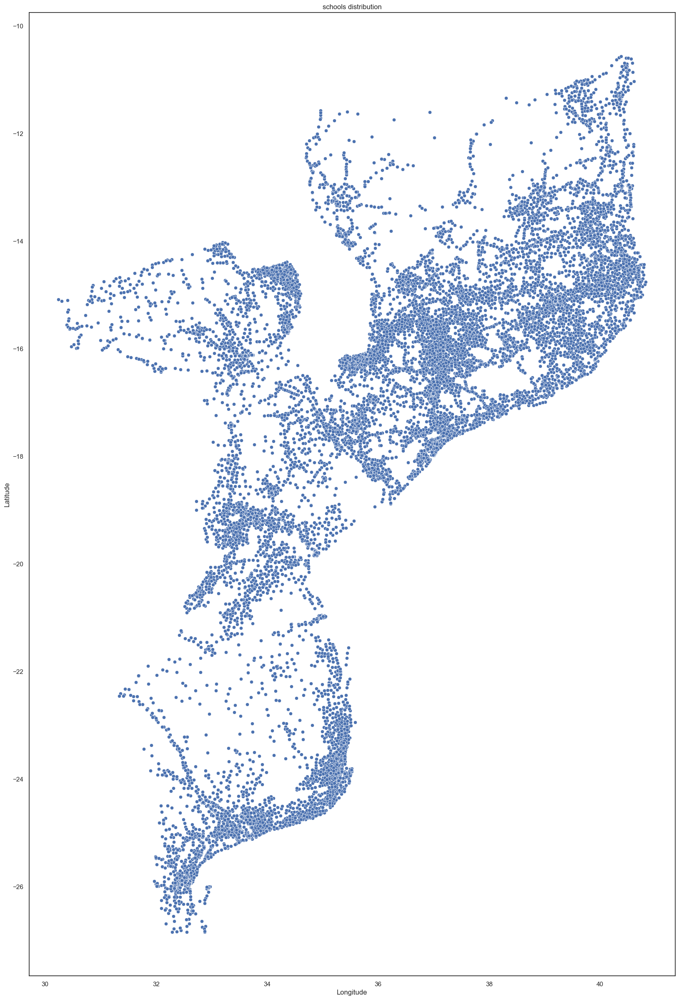

In [263]:
sns.set(style="white")
plt.figure(figsize=(20, 30))
sns.scatterplot(data=numeric_data, x='Longitude', y='Latitude', sizes=(50, 200))
plt.title('schools distribution')
plt.show()


#### resources distribution

##### values plotted on different maps

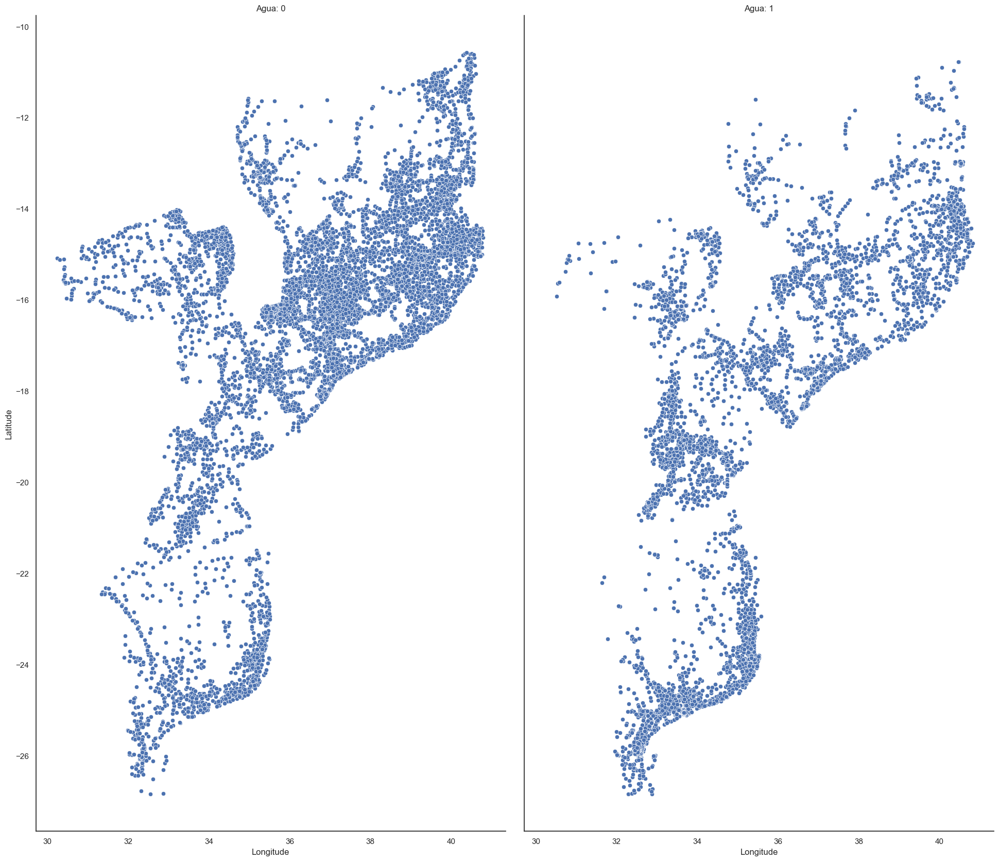

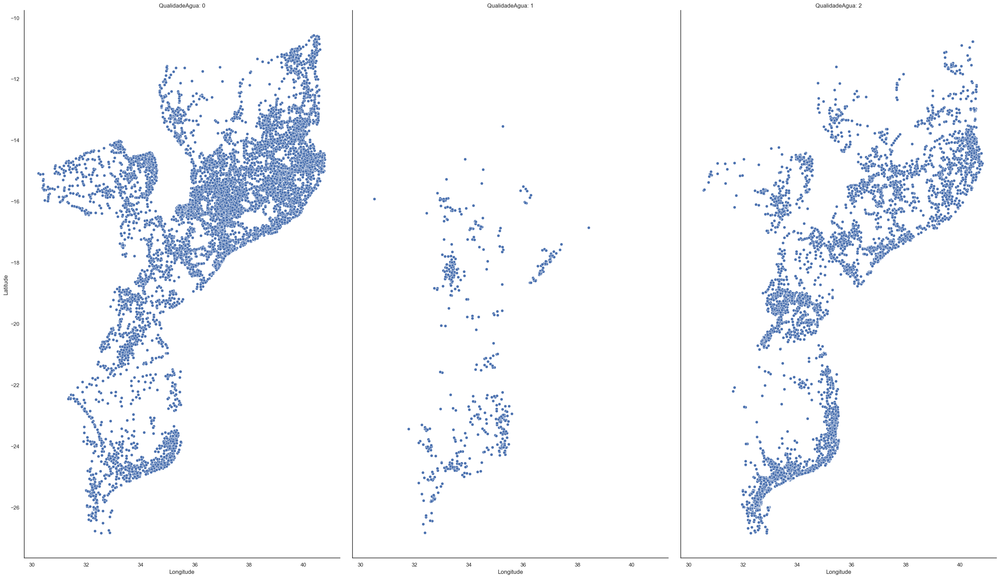

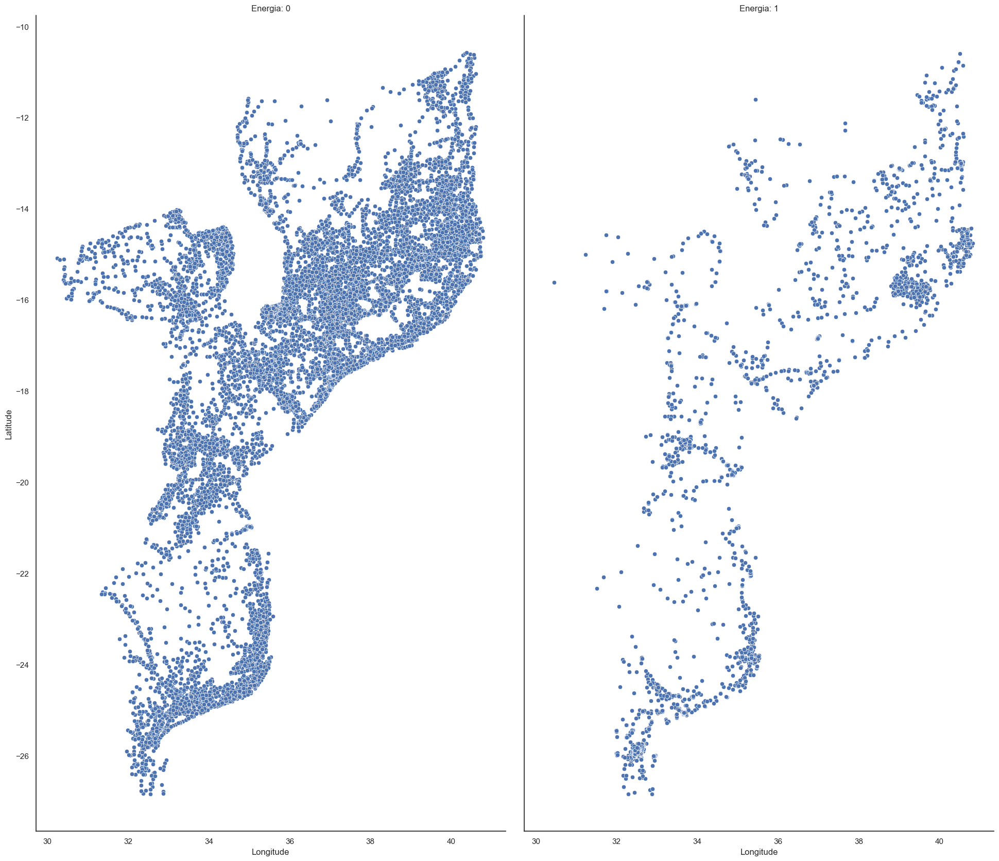

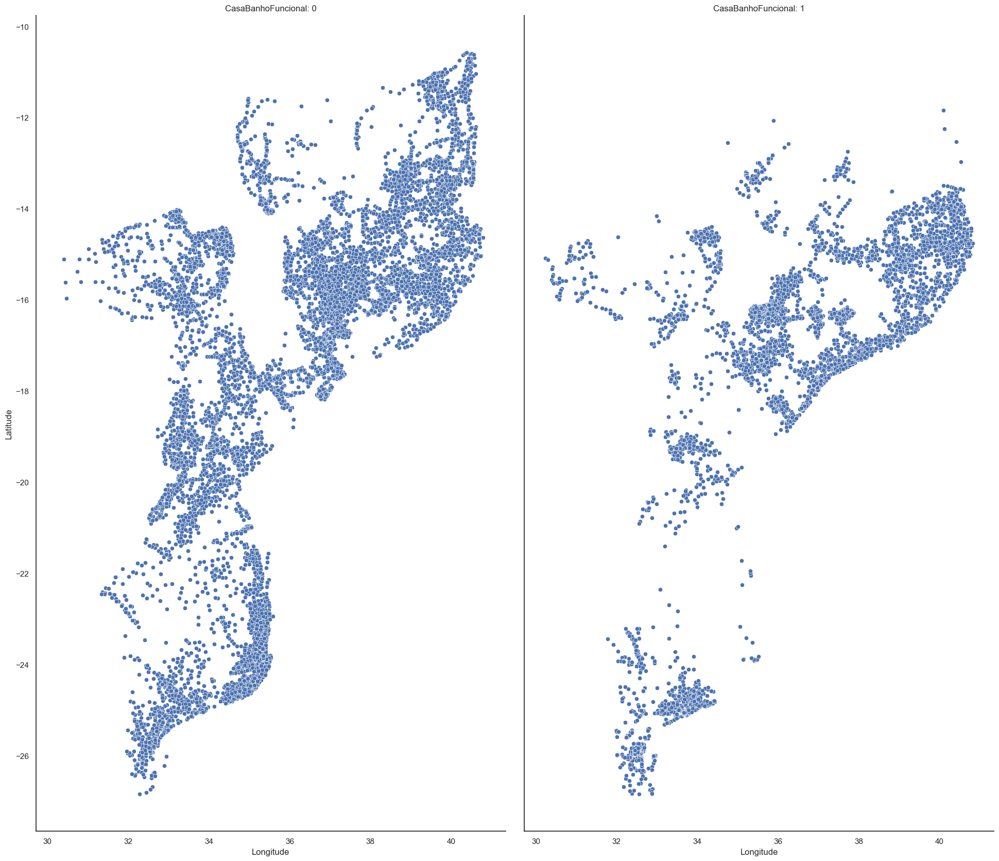

In [264]:
resources = ['Agua', 'QualidadeAgua', 'Energia', 'CasaBanhoFuncional']
sns.set(style="white")

for resource in resources:

    g = sns.FacetGrid(data=numeric_data, col=resource, col_wrap=3, height=5)
    g.map(sns.scatterplot, 'Longitude', 'Latitude', sizes=(50, 250))
    g.set_titles(resource + ': {col_name}')
    g.fig.set_size_inches(30, 20)
    plt.show()

##### values plotted in heatmaps

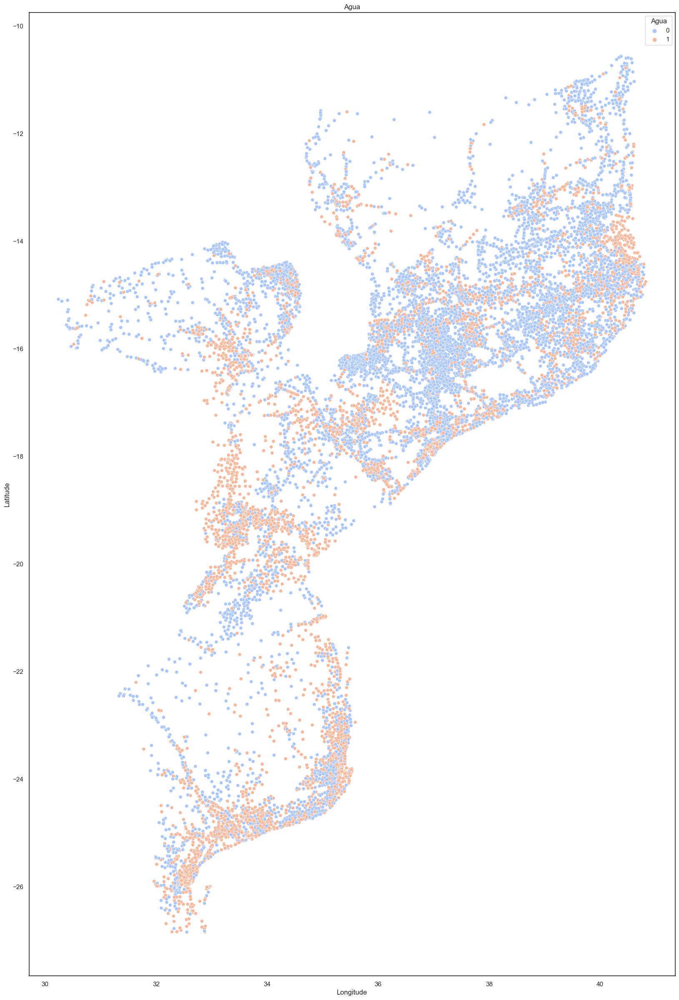

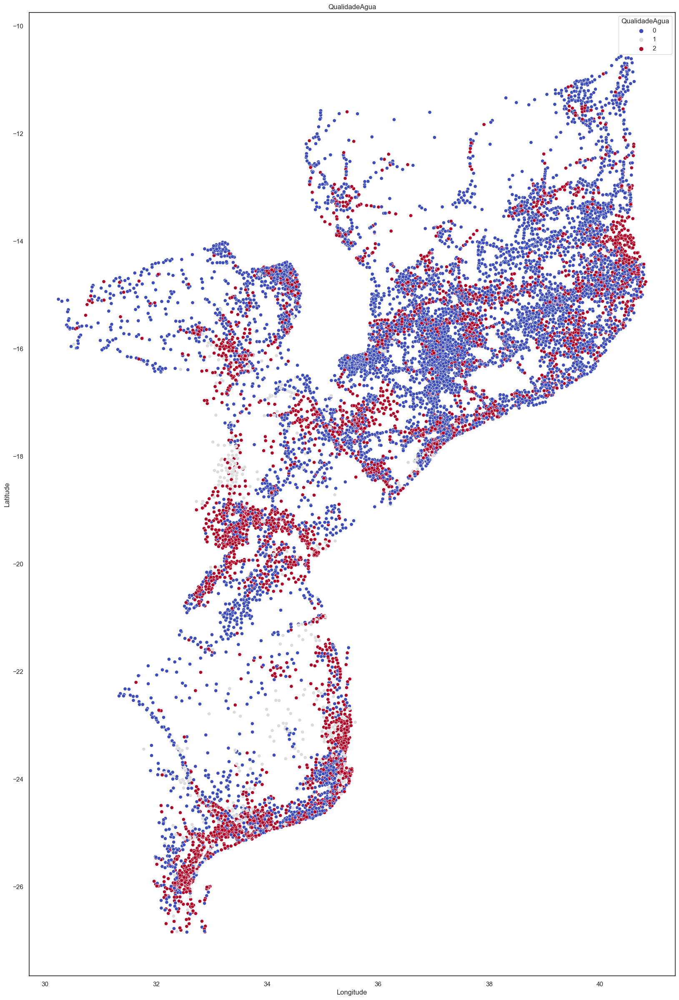

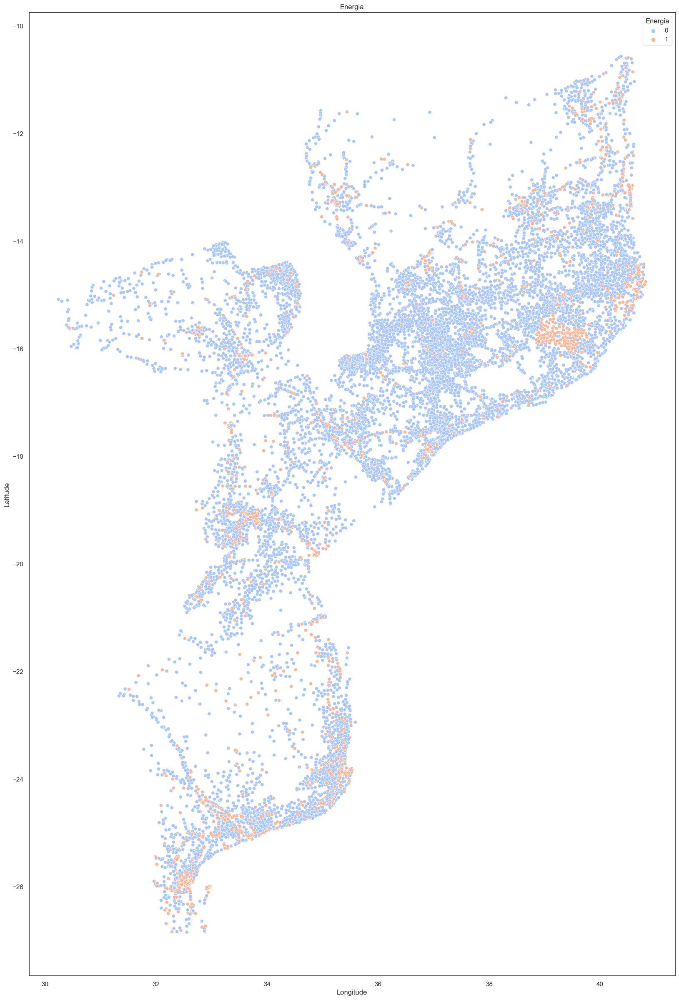

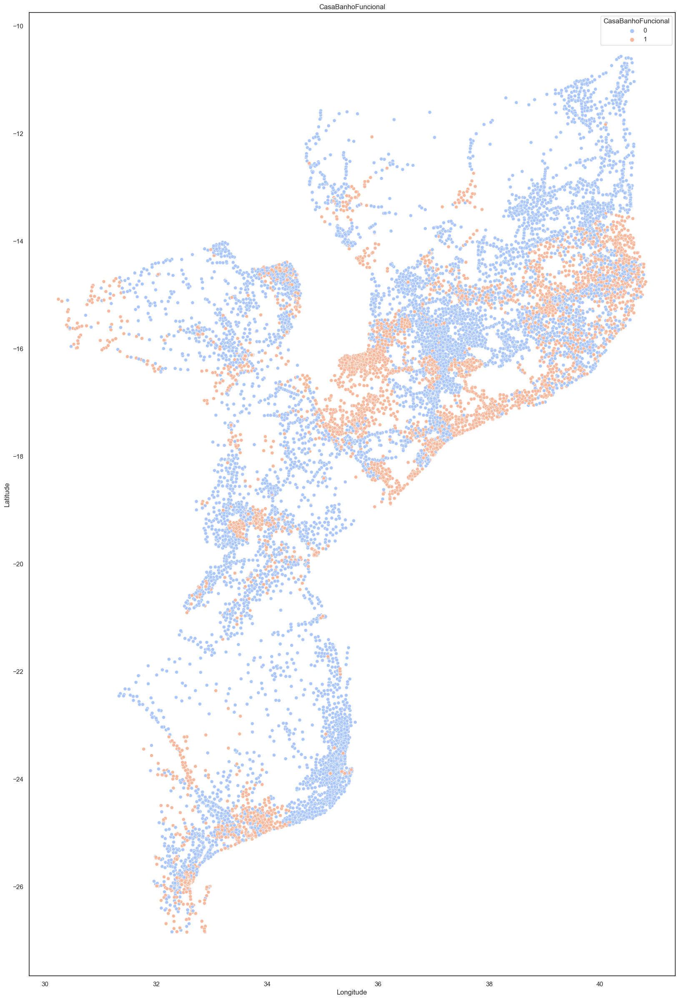

In [265]:
resources = ['Agua', 'QualidadeAgua', 'Energia', 'CasaBanhoFuncional']

for resource in resources:
    
    sns.set(style="white")
    plt.figure(figsize=(20, 30))
    sns.scatterplot(data=numeric_data, x='Longitude', y='Latitude', hue=resource, palette='coolwarm', sizes=(50, 200))
    plt.title(resource)
    plt.show()


##### distribution of schools with and without minimum conditions

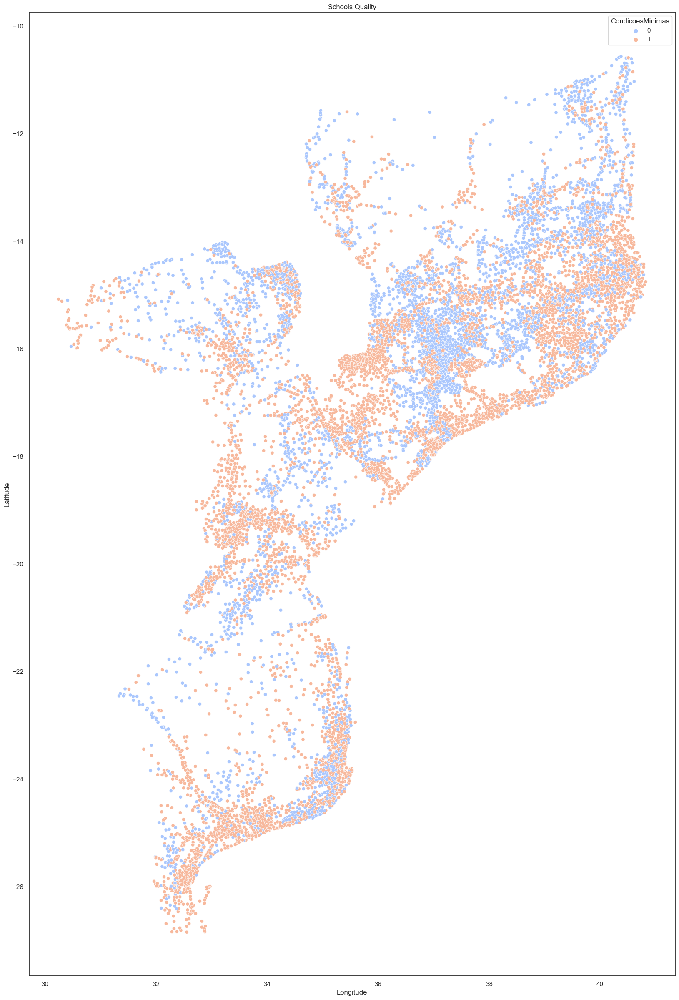

In [266]:
sns.set(style="white")
plt.figure(figsize=(20, 30))
sns.scatterplot(data=numeric_data, x='Longitude', y='Latitude', hue='CondicoesMinimas', palette='coolwarm', sizes=(50, 200))
plt.title('Schools Quality')
plt.show()


### resources distribution

##### resource availability

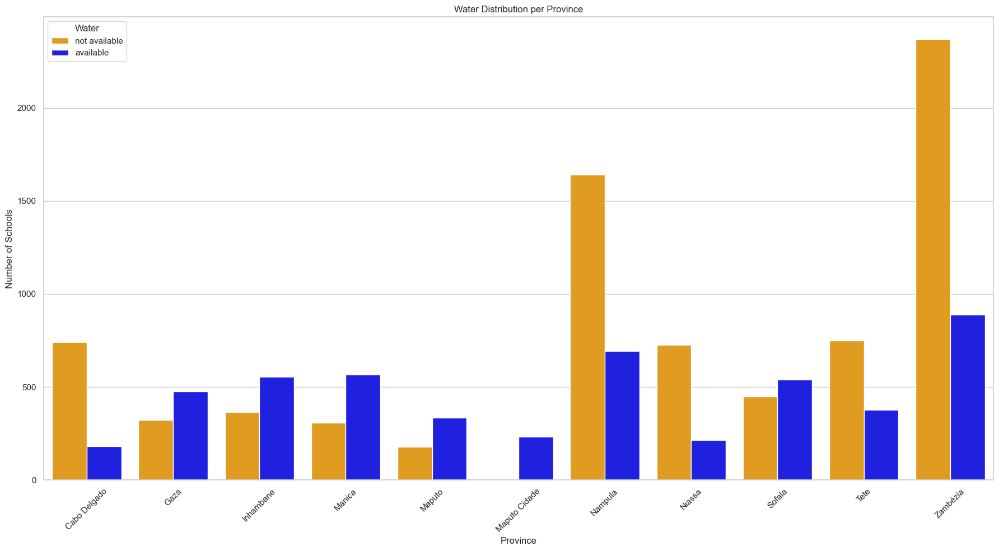

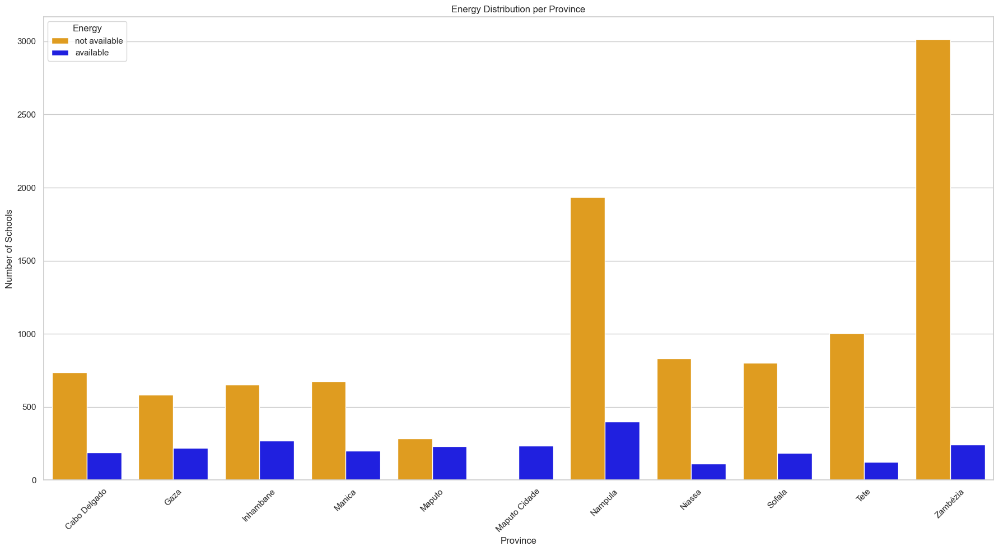

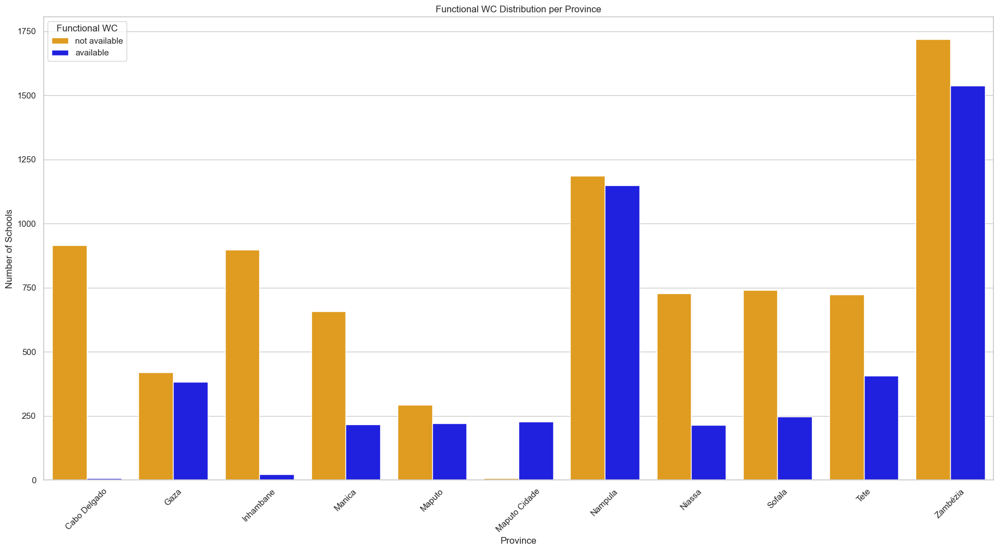

In [9]:
resources_en = ['Province', 'Water', 'Energy', 'Functional WC']
resources_pt = ['Provincia', 'Agua', 'Energia', 'CasaBanhoFuncional']

colors_palette = {"Sim": "blue", "Não": "orange"}

# Iterate through the resource names (excluding the first one, 'Province')
for i in range(len(resources_en) - 1):

     # Group the data by 'Province' and the current resource
    resource_data = data.groupby(['Provincia', resources_pt[i+1]]).size().reset_index(name='count')
    
    plt.figure(figsize=(18, 10))
    sns.set(style="whitegrid")
    sns.barplot(data=resource_data, x='Provincia', y='count', hue=resources_pt[i+1], palette=colors_palette, errorbar=None)
    
    
    plt.title(f'{resources_en[i+1]} Distribution per Province')
    plt.xlabel('Province')
    plt.ylabel('Number of Schools')
    plt.legend(title=resources_en[i+1], loc='upper left', labels=['not available', 'available'])
    
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


##### resource type

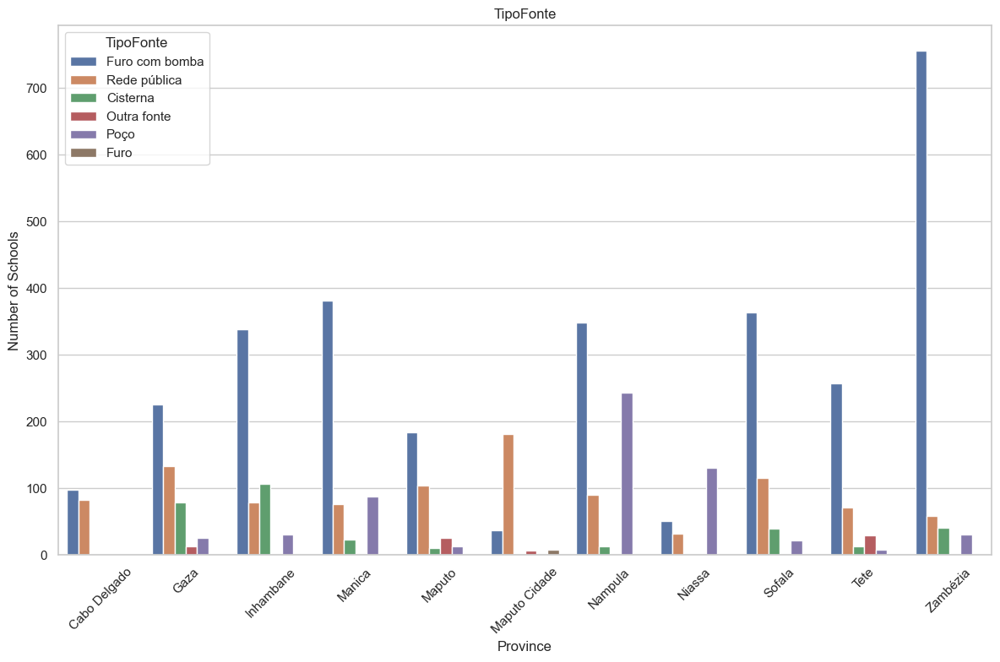

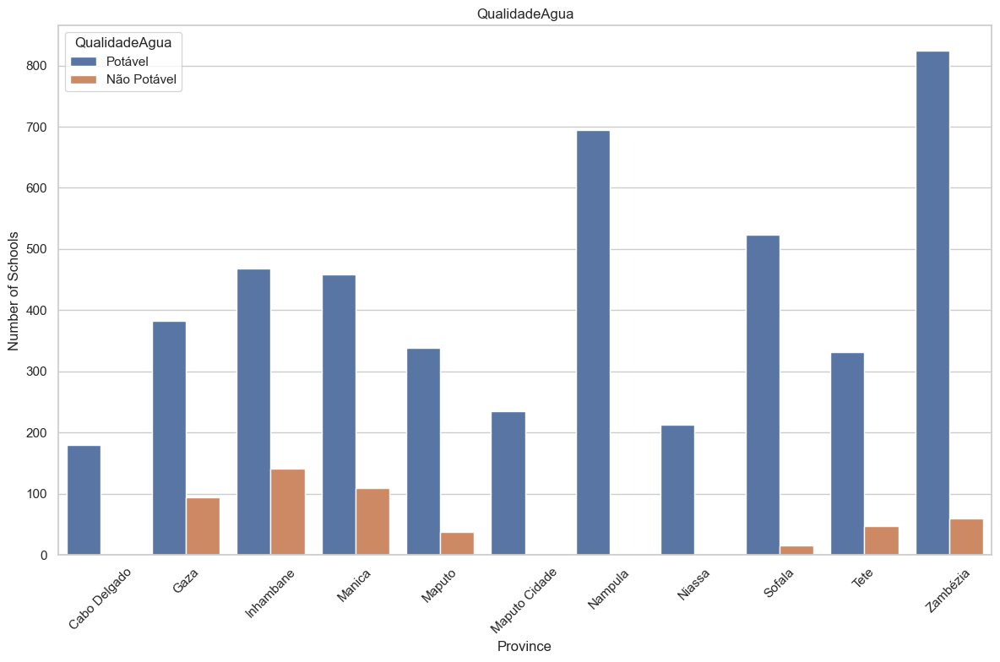

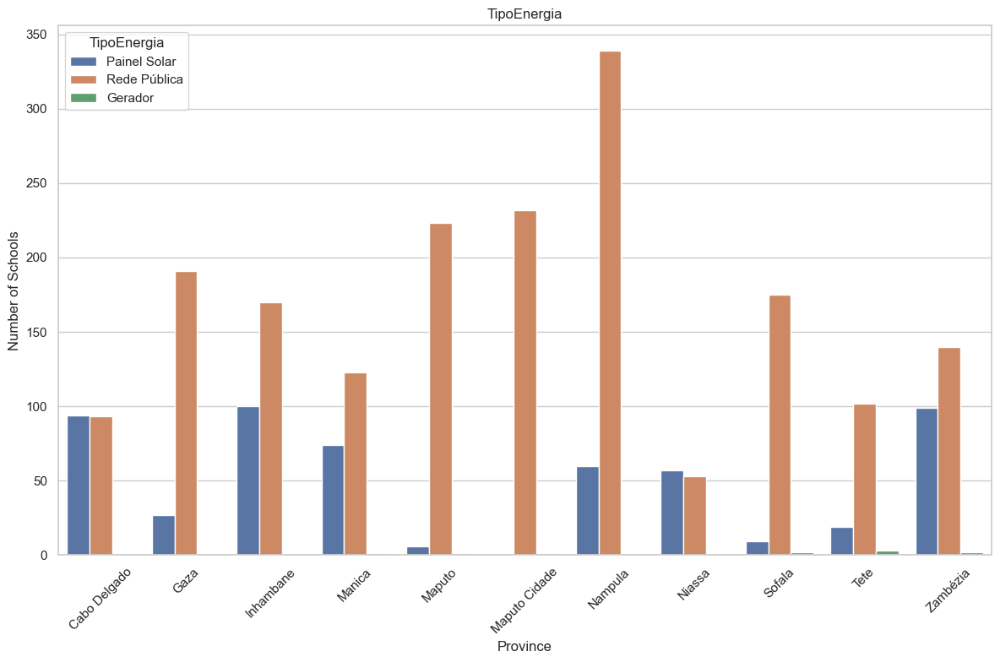

In [268]:
resources = ['TipoFonte', 'QualidadeAgua', 'TipoEnergia']
no_resources = ['Nenhuma Fonte', 'Nenhuma', 'Nenhum']

for resource in resources:
    resource_data = data.groupby(['Provincia', resource]).size().reset_index(name='count')
    resource_data = resource_data.loc[~resource_data[resource].isin(no_resources)]

    
    plt.figure(figsize=(12, 8))
    sns.set(style="whitegrid")
    sns.barplot(data=resource_data, x='Provincia', y='count', hue=resource, palette='deep', errorbar=None)

    plt.title(resource)
    plt.xlabel('Province')
    plt.ylabel('Number of Schools')
    plt.legend(title=resource, loc='upper left', labels=resource_data[resource].unique())

    plt.xticks(rotation=45) 
    plt.tight_layout()
    plt.show()


##### table

In [269]:
provinces = data['Provincia'].dropna().unique()
table_resources = ['Agua', 'Energia', 'CasaBanhoFuncional']

table = {'Provincias': [], 'Escolas': [],}


for province in provinces:

    schools = data['Provincia'].value_counts().get(province, 0)
    
    table['Provincias'].append(province)
    table['Escolas'].append(schools)
    
    for resourse in table_resources:
    
        resourse_list = data.loc[data['Provincia'] == province, resourse].values
    
        for resourse_value in list(dict.fromkeys(resourse_list)):

            total = np.count_nonzero(resourse_list == resourse_value)
            new_key = f'{resourse}({resourse_value})'

            if new_key not in table:
                table[new_key] = []
                
            table[new_key].append(total)



table['Provincias'].append('Total')

for i, k in enumerate(list(table.keys())):
    if i > 0:
        table[k].append(sum(table[k]))

print(table)

{'Provincias': ['Manica', 'Niassa', 'Cabo Delgado', 'Zambézia', 'Tete', 'Inhambane', 'Gaza', 'Maputo', 'Maputo Cidade', 'Nampula', 'Sofala', 'Total'], 'Escolas': [874, 941, 922, 3257, 1129, 920, 801, 513, 235, 2334, 988, 12914], 'Agua(Não)': [307, 727, 742, 2370, 751, 365, 324, 177, 2, 1640, 448, 7853], 'Agua(Sim)': [567, 214, 180, 887, 378, 555, 477, 336, 233, 694, 540, 5061], 'Energia(Não)': [676, 831, 735, 3016, 1005, 650, 583, 283, 2, 1935, 802, 10518], 'Energia(Sim)': [198, 110, 187, 241, 124, 270, 218, 230, 233, 399, 186, 2396], 'CasaBanhoFuncional(Não)': [658, 727, 916, 1719, 723, 898, 419, 292, 7, 1186, 740, 8285], 'CasaBanhoFuncional(Sim)': [216, 214, 6, 1538, 406, 22, 382, 221, 228, 1148, 248, 4629]}


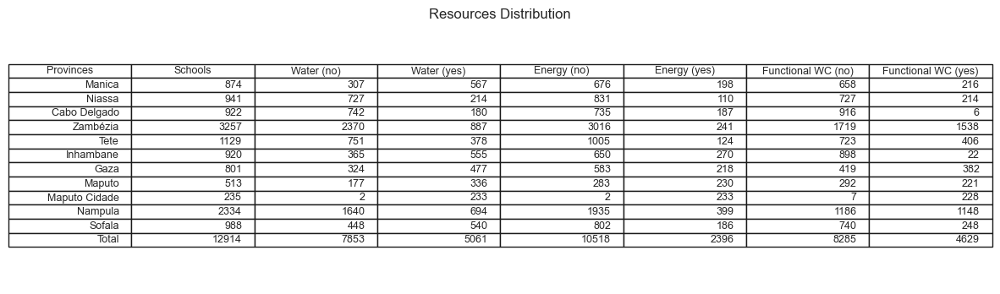

In [270]:
table = pd.DataFrame(table)
table_columns = ['Provinces', 'Schools', 'Water (no)', 'Water (yes)', 'Energy (no)', 'Energy (yes)', 'Functional WC (no)', 'Functional WC (yes)']

fig, ax = plt.subplots(figsize=(15, 4))
ax.axis('off') 

ax.table(cellText=table.values, colLabels=table_columns, loc='center')

plt.title('Resources Distribution')
plt.show()

##### save dataset

In [271]:
table.to_csv('../../data/processed/school_data(sums).csv', index=False)

### data correlaction

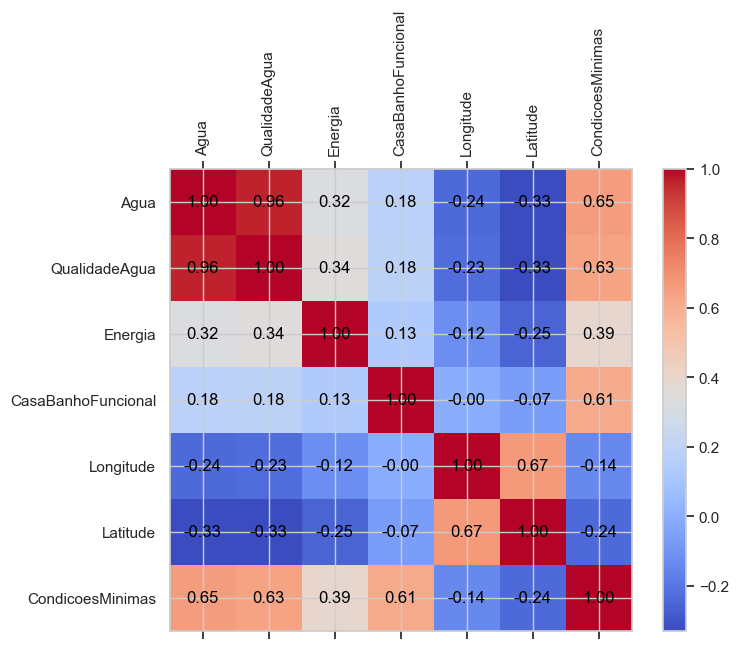

In [272]:
correlation_matrix = numeric_data.corr()

fig, ax = plt.subplots(figsize=(8, 6))

cax = ax.matshow(correlation_matrix, cmap='coolwarm')

plt.colorbar(cax)

plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)

for i in range(len(correlation_matrix.columns)):
    for j in range(len(correlation_matrix.columns)):
        text = f"{correlation_matrix.iloc[i, j]:.2f}"
        ax.text(j, i, text, ha='center', va='center', color='black')

plt.show()